<a href="https://colab.research.google.com/github/AlexandreLarget/advanced_computer_vision/blob/main/08_ACV_obejct_detection_SSD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install the objct detection API

In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 79704, done.
remote: Counting objects: 100% (410/410), done.
remote: Compressing objects: 100% (237/237), done.
remote: Total 79704 (delta 224), reused 327 (delta 169), pack-reused 79294
Receiving objects: 100% (79704/79704), 594.13 MiB | 30.54 MiB/s, done.
Resolving deltas: 100% (56672/56672), done.


In [ ]:
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=.

In [ ]:
!cd models/research && \
    cp object_detection/packages/tf2/setup.py . && \
    python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 14.5 MB 387 kB/s 
     |████████████████████████████████| 352 kB 65.1 MB/s 
     |████████████████████████████████| 2.4 MB 61.5 MB/s 
     |████████████████████████████████| 26.9 MB 1.5 MB/s 
     |████████████████████████████████| 67 kB 7.6 MB/s 
     |████████████████████████████████| 116 kB 78.7 MB/s 
     |████████████████████████████████| 2.3 MB 60.8 MB/s 
     |████████████████████████████████| 43 kB 2.4 MB/s 
     |███

In [ ]:
import os
import pathlib
import tensorflow as tf

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

# Downaload images

In [ ]:
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/walkingdog.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/traffic.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/jungle.jpeg
!wget -nc https://lazyprogrammer.me/course_files/object_detection_images/intersection.jpeg

--2022-12-14 07:58:23--  https://lazyprogrammer.me/course_files/object_detection_images/walkingdog.jpeg
Resolving lazyprogrammer.me (lazyprogrammer.me)... 172.67.213.166, 104.21.23.210, 2606:4700:3030::ac43:d5a6, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|172.67.213.166|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 195368 (191K) [image/jpeg]
Saving to: ‘walkingdog.jpeg’

walkingdog.jpeg     100%[===================>] 190.79K  --.-KB/s    in 0.1s    

2022-12-14 07:58:23 (1.39 MB/s) - ‘walkingdog.jpeg’ saved [195368/195368]

--2022-12-14 07:58:23--  https://lazyprogrammer.me/course_files/object_detection_images/traffic.jpeg
Resolving lazyprogrammer.me (lazyprogrammer.me)... 172.67.213.166, 104.21.23.210, 2606:4700:3030::ac43:d5a6, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|172.67.213.166|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 160514 (157K) [image/jpeg]
Saving to: ‘traffic.jpeg’

traffic.jpeg        

In [ ]:
!ls

intersection.jpeg  models	traffic.jpeg
jungle.jpeg	   sample_data	walkingdog.jpeg


In [ ]:
IMAGE_PATHS = ["intersection.jpeg", "traffic.jpeg", "jungle.jpeg", "walkingdog.jpeg"]

# Download and extract model files

In [ ]:
url = "http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz"

PATH_TO_MODEL_DIR = tf.keras.utils.get_file(
    fname="ssd_resnet101_v1_fpn_640x640_coco17_tpu-8",
    origin=url,
    untar=True
)

386527459/386527459 [==============================] - 1s 0us/step


In [ ]:
PATH_TO_MODEL_DIR

'/root/.keras/datasets/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8'

# Download Labels File

Problem with the download of the file from github tf.

So copy raw/paste into notepad++ => save as pbtxt => upload to colab
url = 'https://github.com/tensorflow/models/blob/5ba16d89abfa8446345aab7729077f6129204a5d/research/object_detection/data/mscoco_label_map.pbtxt'

PATH_TO_LABELS = tf.keras.utils.get_file(
    fname="mscoco_complete_label_map.pbtxt",
    origin=url,
    extract=False,
    cache_dir="/content"
)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving label.pbtxt to label.pbtxt


In [ ]:
PATH_TO_LABELS = '/content/label.pbtxt'

In [ ]:
!head {PATH_TO_LABELS}

item {
  name: "background"
  id: 0
  display_name: "background"
}
item {
  name: "/m/01g317"
  id: 1
  display_name: "person"
}


# Load in the model

In [ ]:
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print("Loading model....", end="")
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elasped_time = end_time - start_time
print(f"Done! Took {elasped_time:.2f} seconds.")

Loading model....Done! Took 23.94 seconds.


# Load in the labels

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(
    PATH_TO_LABELS,
    use_display_name=True
)

In [ ]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 12: {'id': 12, 'name': '12'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 26: {'id': 26, 'name': '26'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 29: {'id': 29, 'name': '29'},
 30: 

# Helper function

In [ ]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

# Do some object detection

In [ ]:
def detect_objects(image_path):
  print(f"Running inference for {image_path}", end="")

  image_np = load_image_into_numpy_array(image_path)

  # Convert to tensor
  input_tensor = tf.convert_to_tensor(image_np)

  # Expand dims for batch
  input_tensor = tf.expand_dims(input_tensor, axis=0)

  # Do the detection
  detections = detect_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections. 
  num_detections = int(detections.pop("num_detections"))
  detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}
  detections["num_detections"] = num_detections

  # detections_classes should be int
  detections["detection_classes"] = detections["detection_classes"].astype(np.int64)

  # show classes
  # unique_classes = set(detections['detection_classes'])
  # print("Classes found:")
  # for c in unique_classes:
  #     print(category_index[c]['name'])

  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections["detection_boxes"],
      detections["detection_classes"],
      detections["detection_scores"],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.30,
      agnostic_mode=False
  )

  plt.figure(figsize=(30, 20))
  plt.imshow(image_np_with_detections)
  print(" Done")
  plt.show()

In [ ]:
IMAGE_PATHS

['intersection.jpeg', 'traffic.jpeg', 'jungle.jpeg', 'walkingdog.jpeg']

Running inference for intersection.jpeg Done


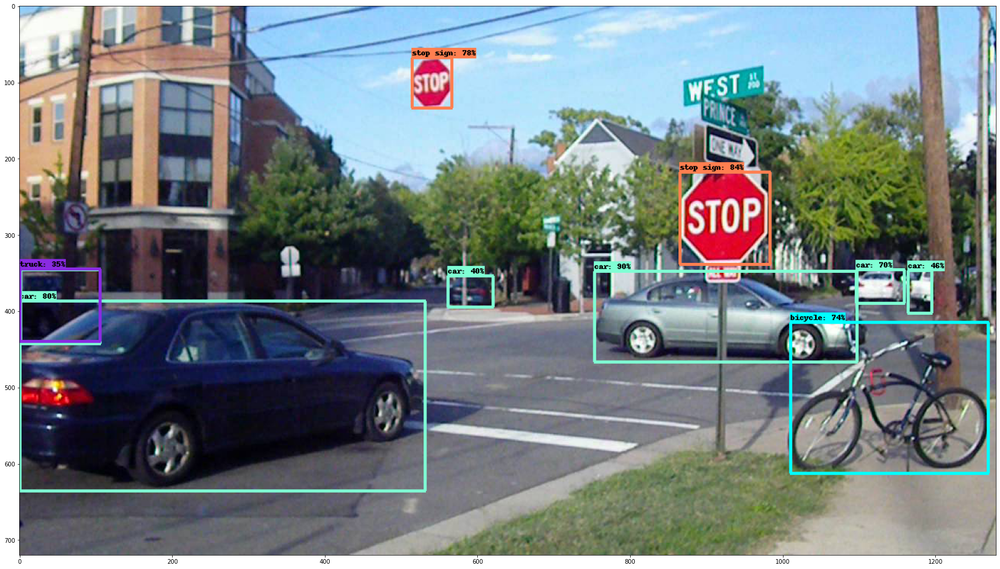

In [ ]:
detect_objects(IMAGE_PATHS[0])

# Function decomposition

In [ ]:
image_path = IMAGE_PATHS[0]

print(f"Running inference for {image_path}", end="")

image_np = load_image_into_numpy_array(image_path)

# Convert to tensor
input_tensor = tf.convert_to_tensor(image_np)

# Expand dims for batch
input_tensor = tf.expand_dims(input_tensor, axis=0)

Running inference for intersection.jpeg

In [ ]:
# Do the detection
detections = detect_fn(input_tensor)

In [ ]:
detections.keys()

dict_keys(['raw_detection_boxes', 'detection_anchor_indices', 'detection_classes', 'detection_boxes', 'detection_scores', 'num_detections', 'raw_detection_scores', 'detection_multiclass_scores'])

In [ ]:
for i, v in detections.items():
  try : 
    print(i, " : ", v.shape, v[0][0][0], "\n")
  except:
    try:
      print(i, " : ", v.shape, v[1][0], "\n")
    except:
      print(i, v.shape, v[0], "\n")

raw_detection_boxes  :  (1, 51150, 4) tf.Tensor(-0.00097557716, shape=(), dtype=float32) 

detection_anchor_indices (1, 100) tf.Tensor(
[49406. 42173. 50832.  5483. 49782. 19620. 20122. 19902. 43690. 43450.
 20129. 18376. 19602. 43933. 21131. 14428. 23602. 19438. 19816. 19432.
 19644. 20004. 20171. 19444. 45107. 23605. 43459. 19890. 19636. 45083.
 21610. 20428. 21611. 16102. 21625.  5483. 43410. 14428. 19450. 19912.
 19894. 18383. 18924. 18918. 20153. 23131. 20014. 19908. 20626. 20147.
 20146. 43428. 19902. 23141. 18936. 18676. 17896. 20602. 19156. 19128.
 18912. 45581. 50832. 18196. 20296. 19666. 21616. 19138. 18918. 19998.
 41771. 20370. 17896. 20860. 19924. 19168. 22972. 20112. 44866. 19210.
 19620. 18672. 43938. 19822. 44176. 19432. 18912. 43654. 19410. 20602.
 20195. 18370. 18682. 43685. 19912. 17896. 43707. 19342. 18186. 18906.], shape=(100,), dtype=float32) 

detection_classes (1, 100) tf.Tensor(
[ 3. 13.  3. 13.  2.  3.  3.  3.  3.  8.  3.  1.  3.  3.  3. 13.  1.  1.
  1.  1.  

In [ ]:
# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections. 
num_detections = int(detections.pop("num_detections"))
num_detections

100

In [ ]:
detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}

for i, v in detections.items():
  try : 
    print(i, " : ", v.shape, v[0][0][0], "\n")
  except:
    try:
      print(i, " : ", v.shape, v[1][0], "\n")
    except:
      print(i, v.shape, v[0], "\n")

raw_detection_boxes  :  (100, 4) -0.02194332 

detection_anchor_indices (100,) 49406.0 

detection_classes (100,) 3.0 

detection_boxes  :  (100, 4) 0.3027805 

detection_scores (100,) 0.89623076 

raw_detection_scores  :  (100, 91) 0.0041627144 

detection_multiclass_scores  :  (100, 91) 0.00028714165 



In [ ]:
detections["num_detections"] = num_detections

In [ ]:
# detections_classes should be int
detections["detection_classes"] = detections["detection_classes"].astype(np.int64)
detections["detection_classes"]

array([ 3, 13,  3, 13,  2,  3,  3,  3,  3,  8,  3,  1,  3,  3,  3, 13,  1,
        1,  1,  1,  3,  1,  8,  1,  2,  1,  8,  3,  3,  2,  1,  1,  1, 10,
        3, 34,  3, 10,  1,  1,  3,  1,  3,  3,  3,  1,  1,  3,  1,  3,  3,
        3,  8,  1,  3,  1, 13,  1,  1,  3,  1,  2, 22,  1,  1,  1,  1,  3,
        1,  1, 64,  3, 10,  3,  1,  3,  2,  3,  2,  3,  8,  1,  3,  1,  3,
        3,  3,  3,  3,  4,  3,  1,  1,  8,  3, 14,  3,  1,  1,  1])

 Done


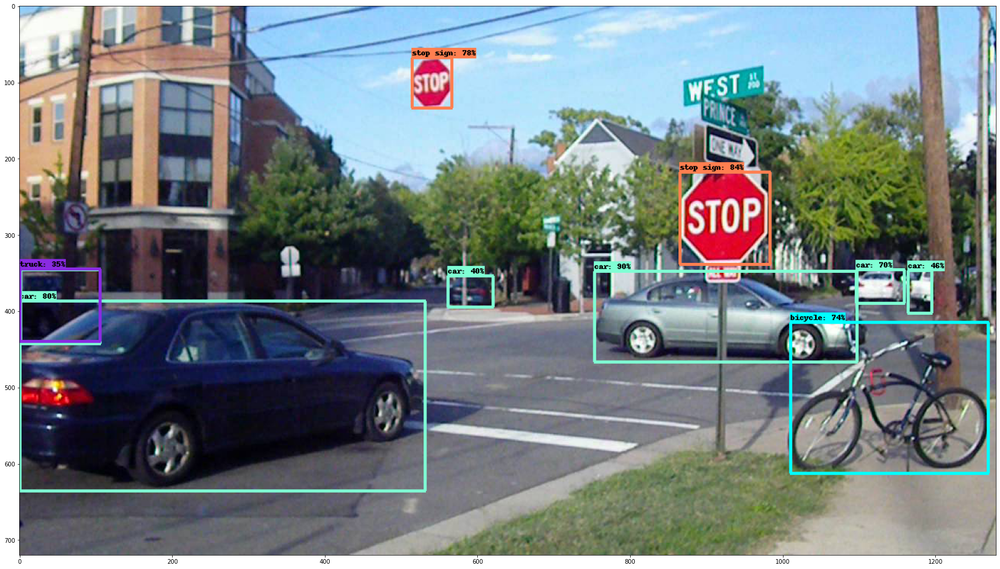

In [ ]:
# show classes
# unique_classes = set(detections['detection_classes'])
# print("Classes found:")
# for c in unique_classes:
#     print(category_index[c]['name'])

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections["detection_boxes"],
    detections["detection_classes"],
    detections["detection_scores"],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=200,
    min_score_thresh=0.30,
    agnostic_mode=False
)

plt.figure(figsize=(30, 20))
plt.imshow(image_np_with_detections)
print(" Done")
plt.show()

Running inference for traffic.jpeg Done


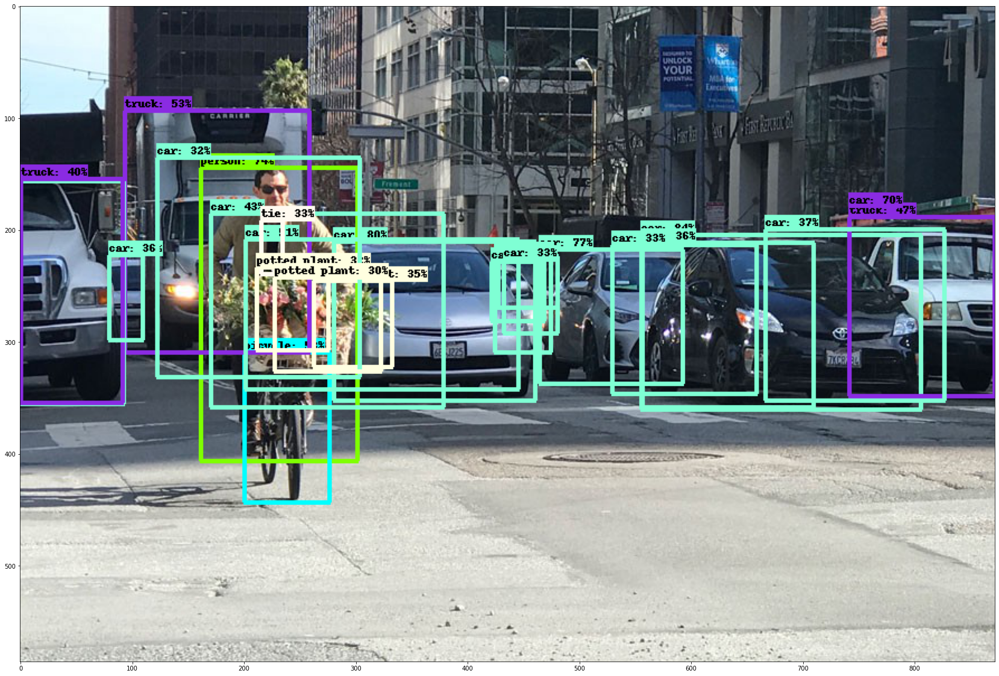

In [ ]:
detect_objects(IMAGE_PATHS[1])

Running inference for jungle.jpeg Done


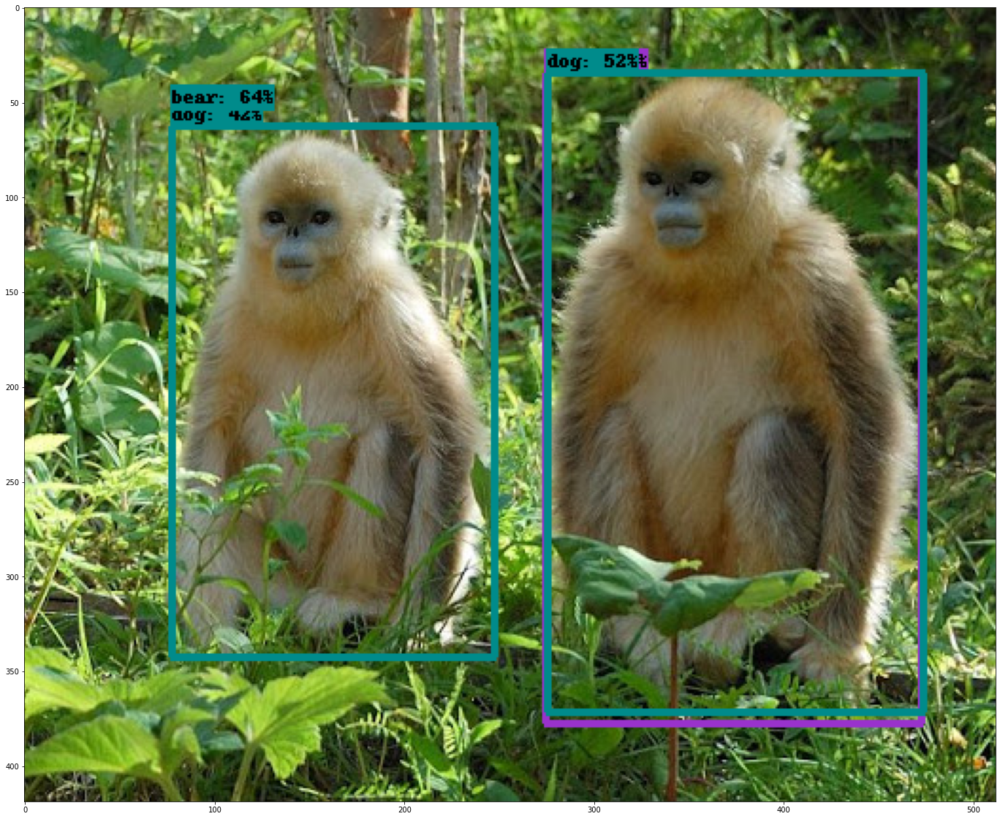

In [ ]:
detect_objects(IMAGE_PATHS[2])

Running inference for walkingdog.jpeg Done


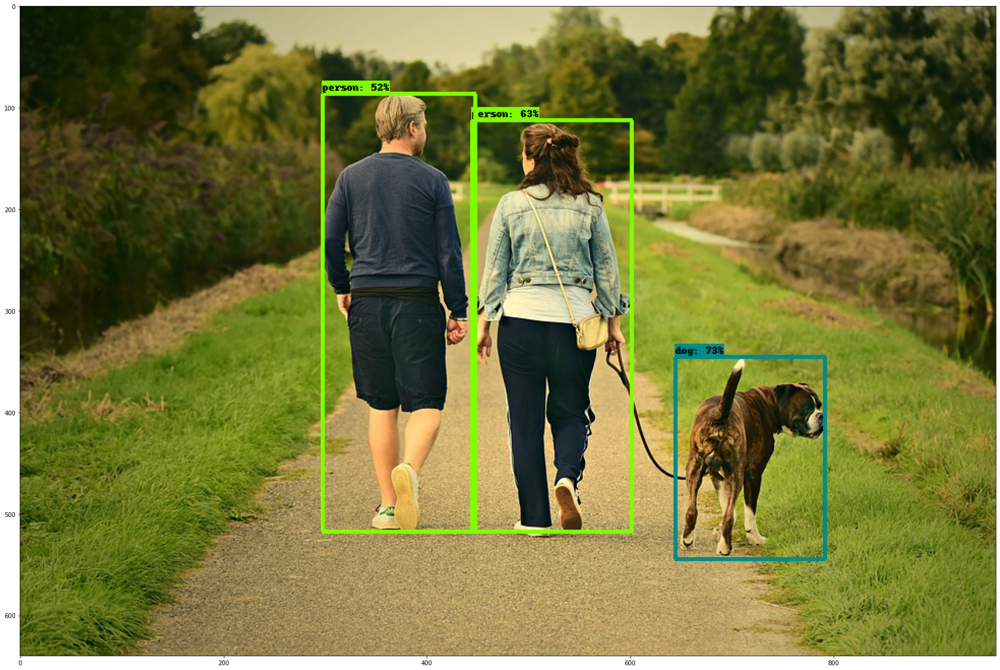

In [ ]:
detect_objects(IMAGE_PATHS[3])